In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Read in Data


* Must have the 'Ridership Model Data.csv' in the project folder;
* Create model_data for training the model which has non-relevant features dropped; and
* Create features to be used for generating future feature values.



In [ ]:
# Read in data and split in to training and prediction sets

df = pd.read_csv('all_data.csv')
correlation = pd.DataFrame(df.drop(['start_of_week'],axis=1).corr()['total_boardings'])
model_data = df[correlation.dropna().index.values].drop('local_business_condition_index', axis=1)
features = model_data.drop(['total_boardings'], axis=1)
features['runtime_hours'] = features['runtime_hours'].rolling(window=10,min_periods=1,center=True).mean()
features = features.fillna(method='backfill').fillna(method='pad')

# Function to get Test Data

* Choose a year to generate values for;
* Select whether the data should reflect pre- or post-covid scenarios; and
* Select whether the data should include 20,000 hours of expansion.

## Methods

* Data is generally generated using a normal distribution with a mean and standard deviation taken from the true data set;
* Some exceptions are the:
  * Year which is the specified year; and
  * Restaurant Bookings which follows a logarithmic distribution.



In [ ]:
feat_desc = features.describe()
feat_nc_desc = features[features['hospitalizations'] == 0].describe()
feat_pc_desc = features[features['hospitalizations'] > 0].describe()
# Log regression for restaurant bookings using post-covid data.
rb_coefs = np.polyfit(np.log(features[features['hospitalizations'] > 0].index.values),
                      features[features['hospitalizations'] > 0]['Restaurant Bookings'],1)

def get_test_data(year,pre_covid=False,expansion=True):
  '''
  Generate randomized data for a specific year.
  '''
  if year > 2021:
    inc = year - 2021
  else:
    inc = 0

  if pre_covid:
    year = [2019] * 52
  else:
    year = [2021] * 52
  if expansion:
    # Add 20,000 hours for each year beyond 2021.
    revenue_hours = np.random.normal(feat_desc['Revenue Hours']['mean'] + inc * 20000 / 52,
                                     feat_desc['Revenue Hours']['std'], size=52)
  else:
    revenue_hours = np.random.normal(feat_desc['Revenue Hours']['mean'],
                                     feat_desc['Revenue Hours']['std'], size=52)
  if pre_covid:
    restaurant_bookings = np.random.normal(feat_nc_desc['Restaurant Bookings']['mean'],
                                           feat_nc_desc['Restaurant Bookings']['std'],
                                           size=52)
  else:
    # Use log regression as the mean for the standard normal with weeks starting at 156 (2022), maxing out at 0.
    restaurant_bookings = np.random.normal(rb_coefs[0] * np.log(range(104 + inc * 52,156 + inc * 52)) + rb_coefs[1],
                                           feat_desc['Restaurant Bookings']['std'])
  gas_price = np.random.normal(feat_desc['Gas Price (C/L)']['mean'],
                               feat_desc['Gas Price (C/L)']['std'],size=52)
  if np.random.randn() > 0 or pre_covid:
    uni_season = features[features['ISOYear'] == 2019]['University School Season']
  else:
    uni_season = features[features['ISOYear'] == 2021]['University School Season']
  # Increment employment by 1% per year beyond 2021.
  employment = np.random.normal(feat_desc['Employment']['mean'] * (1 + inc * .01),
                                feat_desc['Employment']['std'],size=52)
  if pre_covid:
    wfh = np.random.normal(feat_nc_desc['WFH']['mean'],
                           feat_nc_desc['WFH']['std'],size=52)
  else:
    wfh = np.random.normal(feat_pc_desc['WFH']['mean'],feat_pc_desc['WFH']['std'],size=52)
  if pre_covid:
    hospitalizations = np.zeros(52)
  else:
    hospitalizations = np.random.normal(feat_pc_desc['hospitalizations']['mean'],
                                        feat_pc_desc['hospitalizations']['std'],
                                        size=52)

  df = np.array([year, revenue_hours, restaurant_bookings, gas_price, uni_season, employment, wfh, hospitalizations]).transpose()
  df = pd.DataFrame(data=df,columns=features.columns)

  return df

KeyError: ignored

# Train Test Split

In [ ]:
from sklearn.preprocessing import MinMaxScaler

In [ ]:
# Scale the data for model training.
X = features
y = model_data['total_boardings']

scaler = MinMaxScaler()
X = scaler.fit_transform(X)

In [ ]:
X.shape

(115, 43)

# Create and Train the Model

* Hyperparameters have been selected based on previous testing of the model.

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout
from tensorflow.keras.optimizers import Adam

In [ ]:
# Deep fully-connected neural network consisting of four layers (8 -> 5 -> 3 -> 1).
# Rectified linear unit activation functions for non-ouput layers.
# No dropouts as this hindered performance in the model testing.
# Adam optimizer and mse loss function for regression on a single output variable.
model = Sequential()

model.add(Dense(43,activation='relu'))
model.add(Dense(21,activation='relu'))
model.add(Dense(10,activation='relu'))
model.add(Dense(5,activation='relu'))
model.add(Dense(1))

model.compile(optimizer='Adam', loss='mse')

In [ ]:
# Fit the model to all our data - 200 epochs chosen based on test runs with validation data.
model.fit(x=X,y=y,batch_size=1,epochs=200)

Epoch 1/200
115/115 [==============================] - 1s 2ms/step - loss: 122936836096.0000
Epoch 2/200
115/115 [==============================] - 0s 2ms/step - loss: 122743832576.0000
Epoch 3/200
115/115 [==============================] - 0s 2ms/step - loss: 119967907840.0000
Epoch 4/200
115/115 [==============================] - 0s 2ms/step - loss: 105423437824.0000
Epoch 5/200
115/115 [==============================] - 0s 2ms/step - loss: 68329189376.0000
Epoch 6/200
115/115 [==============================] - 0s 2ms/step - loss: 25062516736.0000
Epoch 7/200
115/115 [==============================] - 0s 2ms/step - loss: 8884416512.0000
Epoch 8/200
115/115 [==============================] - 0s 2ms/step - loss: 7429114880.0000
Epoch 9/200
115/115 [==============================] - 0s 2ms/step - loss: 7249793536.0000
Epoch 10/200
115/115 [==============================] - 0s 2ms/step - loss: 7140390912.0000
Epoch 11/200
115/115 [==============================] - 0s 2ms/step - loss: 704

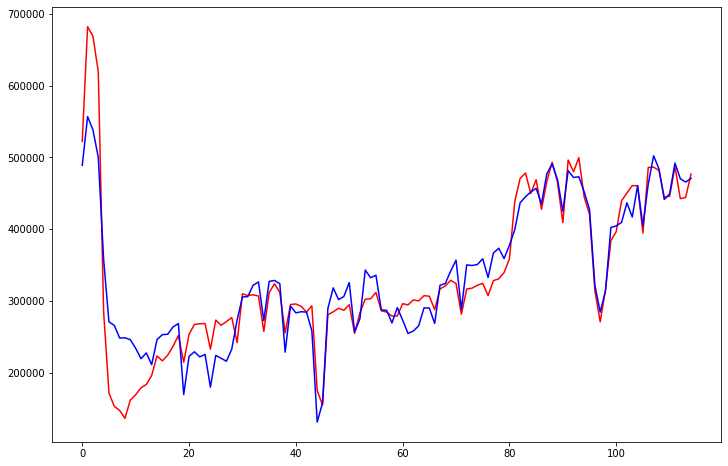

In [ ]:
predictions = model.predict(X)
x = range(0,115,1)
plt.figure(figsize=(12,8))
plt.plot(x,y,'r-',x,predictions,'b-')

# Function to Generate Predictions

* Generate 1000 predictions per week with a given scenario.

In [ ]:
def get_preds(year,pre_covid=False,expansion=True):
  '''
  Generate 1000 predictions with the given features for a specified year.
  '''
  predictions = pd.DataFrame(columns=['Week', 'Prediction'])

  if year > 2021:
    inc = year - 2022
  else:
    inc = 0

  for i in range(0,1000):
    test_data = get_test_data(year,pre_covid,expansion)
    test_data = scaler.transform(test_data)
    test_df = pd.DataFrame()
    test_df['Week'] = range(0 + inc * 52,52 + inc * 52)
    test_df['Prediction'] = model.predict(test_data)
    predictions = pd.concat([predictions, test_df],ignore_index=True)


  return predictions

In [ ]:
pcwe_2022 = get_preds(2022)
pcwe_2023 = get_preds(2023)
pcwe_2024 = get_preds(2024)
pcne_2022 = get_preds(2022,expansion=False)
pcne_2023 = get_preds(2023,expansion=False)
pcne_2024 = get_preds(2024,expansion=False)
ncwe_2022 = get_preds(2022,pre_covid=True)
ncwe_2023 = get_preds(2023,pre_covid=True)
ncwe_2024 = get_preds(2024,pre_covid=True)
ncne_2022 = get_preds(2022,pre_covid=True,expansion=False)
ncne_2023 = get_preds(2023,pre_covid=True,expansion=False)
ncne_2024 = get_preds(2024,pre_covid=True,expansion=False)

pcwe = pd.concat([pcwe_2022,pcwe_2023,pcwe_2024],ignore_index=True)
pcne = pd.concat([pcne_2022,pcne_2023,pcne_2024],ignore_index=True)
ncwe = pd.concat([ncwe_2022,ncwe_2023,ncwe_2024],ignore_index=True)
ncne = pd.concat([ncne_2022,ncne_2023,ncne_2024],ignore_index=True)

In [ ]:
# Create predictions dataframe.
predictions = pd.concat([pcwe,pcne['Prediction'],ncwe['Prediction'],ncne['Prediction']],
                        axis=1,ignore_index=True)
predictions.columns = ['Week','Post-Covid w/ Expansion','Post-Covid no Expansion',
                       'Pre-Covid w/ Expansion','Pre-Covid no Expansion']
predictions['Week'] = predictions['Week'].apply(lambda x: x + 156)

In [ ]:
# Create a true data series with 2022 data (to date).
true_2022 = pd.DataFrame([248779, 384142, 396384, 439561, 452715, 461370, 461929, 356563])
true_data = pd.concat([model_data['Total Boardings'], true_2022],ignore_index=True)
true_data.columns = ['Total Boardings']

# Plot Results

In [ ]:
import plotly.graph_objects as go
import plotly.express as px

In [ ]:
fig = px.scatter(predictions,
                 template='none',
                 x='Week',
                 y=['Week','Post-Covid w/ Expansion','Post-Covid no Expansion','Pre-Covid w/ Expansion',
                    'Pre-Covid no Expansion'],
                trendline='lowess',trendline_options=dict(frac=.2),opacity=0,title='Total Boardings Predictions',
                labels={
                          'Week' : 'Year',
                          'value' : 'Predicted Weekly Boardings',
                          'variable' : 'Scenario'
                      })
fig.update_xaxes(
    ticktext=['2019', '2020', '2021', '2022', '2023', '2024'],
    tickvals=[51, 103, 155, 207, 259, 312],
  )
fig.data = [t for t in fig.data if t.mode == 'lines']
fig.update_traces(showlegend=True, selector=dict(mode='lines'))
fig.add_traces(go.Scatter(name='True Data',x=true_data.index.values,y=true_data['Total Boardings']))
fig.add_traces(go.Scatter(name='Post-Covid w/ Expansion',showlegend=False,line=dict(color='lightblue',width=0),
                          x=np.concatenate([pcwe.groupby('Week').describe()['Prediction'].index.values,
                                            pcwe.groupby('Week').describe()['Prediction'].index.values[::-1]]) + 156,
                          y=pd.concat([pcwe.groupby('Week').describe()['Prediction']['75%'],
                                       pcwe.groupby('Week').describe()['Prediction']['25%'][::-1]]), fill='toself'))
fig.add_traces(go.Scatter(name='Post-Covid no Expansion',showlegend=False,line=dict(color='salmon',width=0),
                          x=np.concatenate([pcne.groupby('Week').describe()['Prediction'].index.values,
                                            pcne.groupby('Week').describe()['Prediction'].index.values[::-1]]) + 156,
                          y=pd.concat([pcne.groupby('Week').describe()['Prediction']['75%'],
                                       pcne.groupby('Week').describe()['Prediction']['25%'][::-1]]), fill='toself'))
fig.add_traces(go.Scatter(name='Pre-Covid w/ Expansion',showlegend=False,line=dict(color='lightgreen',width=0),
                          x=np.concatenate([ncwe.groupby('Week').describe()['Prediction'].index.values,
                                            ncwe.groupby('Week').describe()['Prediction'].index.values[::-1]]) + 156,
                          y=pd.concat([ncwe.groupby('Week').describe()['Prediction']['75%'],
                                       ncwe.groupby('Week').describe()['Prediction']['25%'][::-1]]), fill='toself'))
fig.add_traces(go.Scatter(name='Pre-Covid no Expansion',showlegend=False,line=dict(color='mediumvioletred',width=0),
                          x=np.concatenate([ncne.groupby('Week').describe()['Prediction'].index.values,
                                            ncne.groupby('Week').describe()['Prediction'].index.values[::-1]]) + 156,
                          y=pd.concat([ncne.groupby('Week').describe()['Prediction']['75%'],
                                       ncne.groupby('Week').describe()['Prediction']['25%'][::-1]]), fill='toself'))
fig.data = fig.data[::-1]
fig.update_traces(hovertemplate='Predicted Boardings: %{y}')
fig.show()

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
import datetime

In [ ]:
base = datetime.date(2022,1,3)
date_list = [(base + datetime.timedelta(days=7*x)).isoformat() for x in range(0, 156)]

In [ ]:
# Index Levels
outside = ['Pre-Covid no Expansion','Pre-Covid no Expansion','Pre-Covid no Expansion','Pre-Covid w/ Expansion','Pre-Covid w/ Expansion','Pre-Covid w/ Expansion',
           'Post-Covid no Expansion','Post-Covid no Expansion','Post-Covid no Expansion','Post-Covid w/ Expansion','Post-Covid w/ Expansion','Post-Covid w/ Expansion']
inside = ['Prediction', '25%', '75%','Prediction', '25%', '75%','Prediction', '25%', '75%','Prediction', '25%', '75%']
hier_index = list(zip(outside,inside))
hier_index = pd.MultiIndex.from_tuples(hier_index)
output = pd.DataFrame(index=date_list,columns=hier_index)
output.index.name = 'Start of Week'

In [ ]:
output.loc[:,('Pre-Covid no Expansion','Prediction')] = np.unique(fig.data[-4].y)
output.loc[:,('Pre-Covid no Expansion','25%')] = ncne.groupby('Week').describe()['Prediction']['25%'].values
output.loc[:,('Pre-Covid no Expansion','75%')] = ncne.groupby('Week').describe()['Prediction']['75%'].values
output.loc[:,('Pre-Covid w/ Expansion','Prediction')] = np.unique(fig.data[-3].y)
output.loc[:,('Pre-Covid w/ Expansion','25%')] = ncwe.groupby('Week').describe()['Prediction']['25%'].values
output.loc[:,('Pre-Covid w/ Expansion','75%')] = ncwe.groupby('Week').describe()['Prediction']['75%'].values
output.loc[:,('Post-Covid no Expansion','Prediction')] = np.unique(fig.data[-2].y)
output.loc[:,('Post-Covid no Expansion','25%')] = pcne.groupby('Week').describe()['Prediction']['25%'].values
output.loc[:,('Post-Covid no Expansion','75%')] = pcne.groupby('Week').describe()['Prediction']['75%'].values
output.loc[:,('Post-Covid w/ Expansion','Prediction')] = np.unique(fig.data[-1].y)
output.loc[:,('Post-Covid w/ Expansion','25%')] = pcwe.groupby('Week').describe()['Prediction']['25%'].values
output.loc[:,('Post-Covid w/ Expansion','75%')] = pcwe.groupby('Week').describe()['Prediction']['75%'].values
output.head()

Pre-Covid no Expansion                                \
                 Prediction            25%            75%   
Week                                                        
157           558762.271326  512165.312500  580811.593750   
158           558913.729022  548127.718750  618699.296875   
159           558932.113932  549207.234375  620119.687500   
160           559383.673513  552224.875000  619174.734375   
161           559403.051244  553558.328125  621852.312500   

     Pre-Covid w/ Expansion                                \
                 Prediction            25%            75%   
Week                                                        
157           569424.477208  524900.593750  591709.203125   
158           569552.880177  562033.671875  629257.796875   
159           569631.467871  562913.281250  635819.828125   
160           569979.656205  561636.750000  631845.687500   
161           570184.743316  564910.156250  632574.000000   

     Post-Covid no Expansion                                \
                  Prediction            25%            75%   
Week                                                         
157            375886.129056  292740.054688  405524.046875   
158            375938.340728  332109.859375  447310.031250   
159            375998.528776  339278.812500  449634.281250   
160            376129.667723  331337.523438  439232.492188   
161            376323.488105  335698.171875  445980.687500   

     Post-Covid w/ Expansion                                
                  Prediction            25%            75%  
Week                                                        
157            387510.953889  304330.570312  419311.492188  
158            387543.616997  345973.343750  457154.820312  
159            387624.639289  342326.656250  451029.437500  
160            387698.133398  344413.640625  453585.226562  
161            387933.371499  347292.335938  453933.539062

In [ ]:
from google.colab import files

output.to_csv('output.csv', encoding = 'utf-8-sig')
files.download('output.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>